# pix2pix

[pix2pix 공식 프로젝트 페이지] : https://phillipi.github.io/pix2pix/ <br>
[pix2pix 논문] :https://arxiv.org/abs/1611.07004

In [1]:
# instance normalization을 편하게 사용하기 위한 라이브러리 설치
# !pip install tensorflow-addons

In [1]:
# 필요한 라이브러리들 import
import os
import glob
import numpy as np
import tensorflow as tf
import tensorflow_addons as tfa
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import pandas as pd

os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # 우리는 0 또는 1

2023-09-22 06:07:49.312083: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/home/j-j9a306/.local/lib/python3.9/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
!python --version

Python 3.9.7


In [3]:
!nvidia-smi

Fri Sep 22 06:07:51 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 515.65.01    Driver Version: 515.65.01    CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-PCIE...  On   | 00000000:03:00.0 Off |                    0 |
| N/A   30C    P0    23W / 250W |     13MiB / 32768MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla V100-PCIE...  On   | 00000000:04:00.0 Off |                    0 |
| N/A   

데이터 기본 설정

In [4]:
base_path = './'

In [5]:
# !unzip -o ./combined_images/cartoon_set.zip -d ./combined_images/cartoon_set

In [6]:
# 주제에 대한 이름 (string)
# 다른 데이터를 고려할 경우 이 부분을 바꾸어주어야 합니다
target_name = "maple_character"

# 데이터들이 들어있는 디렉토리
# image_directory = os.path.join(base_path, f'combined_images/{target_name}')

# !mkdir /content/bmw
image_directory = f"./combined_images/{target_name}"

print()
print()
print(f'image_directory : {image_directory}')

# 데이터 개수 확인
number_of_images = len(os.listdir(image_directory))

if target_name == "cartoon_set":
    number_of_images = number_of_images // 2
print(f"number of images : {number_of_images}")



image_directory : ./combined_images/maple_character
number of images : 69372


데이터 로드를 도와줄 함수


In [7]:
BATCH_SIZE = 4               # 한번의 training step (forward, backward prop) 시에 사용할 데이터의 개수
AUTOTUNE = tf.data.AUTOTUNE  # prefetch의 parameter를 AUTOTUNE으로 설정하면 알아서 그때 상황에 맞게 다음 여러 개의 batch를 미리 불러온다
IMAGE_SIZE = 256
RESIZE_SIZE = 256

def map_training_images(file):
    '''
    image file 주소를 받아서 해당 data를 반환해주는 함수

    <params>
        file (string) : image 파일의 경로
    '''

    # img 로드
    # https://stackoverflow.com/questions/44942729/tensorflowvalueerror-images-contains-no-shape
    img = tf.io.decode_image(tf.io.read_file(file), channels=3, expand_animations = False)                      # RGB 이미지로 decode
    img = tf.cast(img, tf.float32)

    # 분할
    edge_img = img[:, :IMAGE_SIZE, :]
    edge_img = tf.image.rgb_to_grayscale(edge_img)
    img = img[:, IMAGE_SIZE:, :]

    edge_img = edge_img / 255.0                                                      # [0, 255] -> [0, 1]
#     edge_img = tf.clip_by_value(edge_img, 0, 1)

    img = img / 127.5 - 1                                                            # [0, 255] -> [-1, 1]
#     img = tf.clip_by_value(img, -1, 1)

    # data augmentation
    is_horizontal_flip = tf.random.uniform(shape=[]) >= 0.5
#     is_zoom = tf.random.uniform(shape=[]) >= 0.5

    if is_horizontal_flip:
        edge_img = tf.image.flip_left_right(edge_img)
        img = tf.image.flip_left_right(img)

#     if is_zoom:
#         # 이미지의 4 방향에서 제외할 픽셀 사이즈
#         border_crop_size = tf.random.uniform(shape=[], minval=0.01, maxval=0.1) * IMAGE_SIZE
#         border_crop_size = tf.cast(border_crop_size, tf.int32)

#         edge_img = edge_img[border_crop_size:-border_crop_size, border_crop_size:-border_crop_size, :]
#         # edge_img = tf.image.resize(edge_img, size=[IMAGE_SIZE, IMAGE_SIZE], method="nearest")

#         img = img[border_crop_size:-border_crop_size, border_crop_size:-border_crop_size, :]
#         # img = tf.image.resize(img, size=[IMAGE_SIZE, IMAGE_SIZE])

    edge_img = tf.image.resize(edge_img, size=[RESIZE_SIZE, RESIZE_SIZE])
    img = tf.image.resize(img, size=[RESIZE_SIZE, RESIZE_SIZE])
    edge_img = tf.clip_by_value(edge_img, 0, 1)
    img = tf.clip_by_value(img, -1, 1)
    
#     # color에 대한 컨디션을 추가하자
#     if target_name == "cartoon_set":
# #         file_name = tf.strings.split(tf.strings.split(file, sep="/")[-1], sep=".")[0]
#         csv_file_path = "." + tf.strings.split(file, sep=".")[1] + ".csv"
#         csv_tensor = tf.io.read_file(csv_file_path)
#         csv_tensor = tf.strings.split(csv_tensor, sep=", ")
        
#         eye_color = tf.strings.to_number(csv_tensor[21], out_type=tf.int32)
#         face_color = tf.strings.to_number(csv_tensor[23], out_type=tf.int32)
#         hair_color = tf.strings.to_number(csv_tensor[25], out_type=tf.int32)
#         glasses_color = tf.strings.to_number(csv_tensor[29], out_type=tf.int32)
        
#         eye_color_condition = tf.reshape(tf.one_hot(eye_color, 5, dtype=tf.float32), shape=(1, 1, 5))
#         eye_color_condition = tf.broadcast_to(eye_color_condition, [RESIZE_SIZE, RESIZE_SIZE, 5])
        
#         face_color_condition = tf.reshape(tf.one_hot(face_color, 11, dtype=tf.float32), shape=(1, 1, 11))
#         face_color_condition = tf.broadcast_to(face_color_condition, [RESIZE_SIZE, RESIZE_SIZE, 11])
        
#         hair_color_condition = tf.reshape(tf.one_hot(hair_color, 10, dtype=tf.float32), shape=(1, 1, 10))
#         hair_color_condition = tf.broadcast_to(hair_color_condition, [RESIZE_SIZE, RESIZE_SIZE, 10])
        
#         glasses_color_condition = tf.reshape(tf.one_hot(glasses_color, 7, dtype=tf.float32), shape=(1, 1, 7))
#         glasses_color_condition = tf.broadcast_to(glasses_color_condition, [RESIZE_SIZE, RESIZE_SIZE, 7])
        
#         edge_img = tf.concat([edge_img, eye_color_condition, face_color_condition, hair_color_condition, glasses_color_condition], axis=-1)

    return edge_img, img


def generate_dataset(image_directory, shuffle_buffer_size):
    '''
    tf.data.Dataset 인스턴스를 반환해주는 함수

    <params>
        image_directory (string) : image 파일 디렉토리
        shuffle_buffer_size (int) : shuffle에 사용할 buffer_size
    '''

    dataset = tf.data.Dataset.list_files(os.path.join(image_directory, "*.jpg"))
    # shuffle이 map보다 앞서는 것이 좋겠다 => 파일 이름들을 섞는 것이 map 결과로 나온 이미지를 섞는 것보다 효율적
    dataset = dataset.shuffle(shuffle_buffer_size).map(map_training_images).batch(BATCH_SIZE).prefetch(AUTOTUNE)

    return dataset

In [8]:
training_dataset = generate_dataset(image_directory, shuffle_buffer_size=number_of_images)

2023-09-22 06:10:03.947028: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-09-22 06:10:03.986273: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-09-22 06:10:03.986827: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

### Model

### Generator

In [9]:
class Residual_Block(tf.keras.Model):
    '''
    Residual Block 클래스:
        Conv2d - InstanceNorm - Relu - Conv2d - InstanceNorm - Add(Residual Connection) 으로 구성
        artifact를 줄이기 위해 reflection padding 채택
    '''

    def __init__(self, input_channels):
        super(Residual_Block, self).__init__()

        self.conv_1 = tf.keras.layers.Conv2D(filters=input_channels, kernel_size=3, padding='valid', use_bias=False,
                                             kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))
        self.instance_norm_1 = tfa.layers.InstanceNormalization()

        self.conv_2 = tf.keras.layers.Conv2D(filters=input_channels, kernel_size=3, padding='valid', use_bias=False,
                                             kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))
        self.instance_norm_2 = tfa.layers.InstanceNormalization()

        self.activation = tf.keras.layers.ReLU()

    def reflection_pad(self, input, pad_size):
        return tf.pad(input, [[0, 0], [pad_size, pad_size], [pad_size, pad_size], [0, 0]], mode='REFLECT')

    def call(self, inputs):
        x = self.reflection_pad(inputs, 1)
        x = self.conv_1(x)
        x = self.instance_norm_1(x)
        x = self.activation(x)

        x = self.reflection_pad(x, 1)
        x = self.conv_2(x)
        x = self.instance_norm_2(x)

        return x + inputs

In [10]:
class Pix2Pix_Generator(tf.keras.Model):
    '''
    Pix2Pix Generator 클래스:
        contracting block + 9 residual blocks + expanding block 으로 구성 => CycleGAN에서의 generator
        (기존 U-net 기반 방식 대신 resnet 기반 방식을 채택)
    '''

    def __init__(self, input_channels, output_channels, hidden_channels=64, name=""):
        super(Pix2Pix_Generator, self).__init__()

        if name:
            self._name = name

        # CycleGAN 저자들의 notation 참고
        # for c7s1-64
        self.c7s1_64_conv = tf.keras.layers.Conv2D(filters=hidden_channels, kernel_size=7, padding='valid', use_bias=False,
                                                   kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))
        self.c7s1_64_instance_norm = tfa.layers.InstanceNormalization()

        # for d128
        self.d128_conv = tf.keras.layers.Conv2D(filters=2*hidden_channels, kernel_size=3, strides=2, padding='valid', use_bias=False,
                                                kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))
        self.d128_instance_norm = tfa.layers.InstanceNormalization()

        # for d256
        self.d256_conv = tf.keras.layers.Conv2D(filters=4*hidden_channels, kernel_size=3, strides=2, padding='valid', use_bias=False,
                                                kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))
        self.d256_instance_norm = tfa.layers.InstanceNormalization()

        # for residual blocks
        R_channels = 4*hidden_channels
        self.R256_1 = Residual_Block(R_channels)
        self.R256_2 = Residual_Block(R_channels)
        self.R256_3 = Residual_Block(R_channels)
        self.R256_4 = Residual_Block(R_channels)
        self.R256_5 = Residual_Block(R_channels)
        self.R256_6 = Residual_Block(R_channels)
        self.R256_7 = Residual_Block(R_channels)
        self.R256_8 = Residual_Block(R_channels)
        self.R256_9 = Residual_Block(R_channels)

        # for u128
        self.u128_conv_transpose = tf.keras.layers.Conv2DTranspose(filters=2*hidden_channels, kernel_size=3, strides=2, padding='same', use_bias=False,
                                                                   kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))
        self.u128_instance_norm = tfa.layers.InstanceNormalization()

        # for u256
        self.u256_conv_transpose = tf.keras.layers.Conv2DTranspose(filters=hidden_channels, kernel_size=3, strides=2, padding='same', use_bias=False,
                                                                   kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))
        self.u256_instance_norm = tfa.layers.InstanceNormalization()

        # for c7s1-3
        self.c7s1_3_conv = tf.keras.layers.Conv2D(filters=output_channels, kernel_size=7, padding='valid',
                                                  kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))

        # activation
        self.relu = tf.keras.layers.ReLU()


    def reflection_pad(self, input, pad_size):
        return tf.pad(input, [[0, 0], [pad_size, pad_size], [pad_size, pad_size], [0, 0]], mode='REFLECT')


    def call(self, inputs):
        # c7s1-64
        x = self.reflection_pad(inputs, 3)
        x = self.c7s1_64_conv(x)
        x = self.c7s1_64_instance_norm(x)
        x = self.relu(x)

        # d128
        x = self.reflection_pad(x, 1)
        x = self.d128_conv(x)
        x = self.d128_instance_norm(x)
        x = self.relu(x)

        # d256
        x = self.reflection_pad(x, 1)
        x = self.d256_conv(x)
        x = self.d256_instance_norm(x)
        x = self.relu(x)

        # R256_1~9
        x = self.R256_1(x)
        x = self.R256_2(x)
        x = self.R256_3(x)
        x = self.R256_4(x)
        x = self.R256_5(x)
        x = self.R256_6(x)
        x = self.R256_7(x)
        x = self.R256_8(x)
        x = self.R256_9(x)

        # u128
        x = self.u128_conv_transpose(x)
        x = self.u128_instance_norm(x)
        x = self.relu(x)

        # u256
        x = self.u256_conv_transpose(x)
        x = self.u256_instance_norm(x)
        x = self.relu(x)

        # c7s1-3
        x = self.reflection_pad(x, 3)
        x = self.c7s1_3_conv(x)

        return tf.keras.activations.tanh(x)


### Discriminator

In [11]:
class Pix2Pix_discriminator(tf.keras.Model):
    '''
    PatchGAN discriminator 클래스:
        receptive field size : 70
    '''

    def __init__(self, input_channels, hidden_channels=64, name=""):
        super(Pix2Pix_discriminator, self).__init__()

        if name:
            self._name = name

        # for C64
        self.C64_conv = tf.keras.layers.Conv2D(filters=hidden_channels, kernel_size=4, strides=2, padding='valid', use_bias=True,
                                               kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))

        # for C128
        self.C128_conv = tf.keras.layers.Conv2D(filters=2*hidden_channels, kernel_size=4, strides=2, padding='valid', use_bias=False,
                                                kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))
        self.C128_instance_norm = tfa.layers.InstanceNormalization()

        # for C256
        self.C256_conv = tf.keras.layers.Conv2D(filters=4*hidden_channels, kernel_size=4, strides=2, padding='valid', use_bias=False,
                                                kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))
        self.C256_instance_norm = tfa.layers.InstanceNormalization()

        # for C512
        self.C512_conv = tf.keras.layers.Conv2D(filters=8*hidden_channels, kernel_size=4, strides=1, padding='valid', use_bias=False,
                                                kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))
        self.C512_instance_norm = tfa.layers.InstanceNormalization()

        # for output
        self.output_conv = tf.keras.layers.Conv2D(filters=1, kernel_size=4, strides=1, padding='valid', use_bias=True,
                                                  kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))

        # activation
        self.LeakyReLU = tf.keras.layers.LeakyReLU(alpha=0.2)


    def reflection_pad(self, input, pad_size):
        return tf.pad(input, [[0, 0], [pad_size, pad_size], [pad_size, pad_size], [0, 0]], mode='REFLECT')


    def call(self, inputs):
        # C64
        x = self.reflection_pad(inputs, 1)
        x = self.C64_conv(x)
        # 저자들이 처음 discriminator block에는 instance norm을 적용하지 않은 것을 참고
        x = self.LeakyReLU(x)

        # C128
        x = self.reflection_pad(x, 1)
        x = self.C128_conv(x)
        x = self.C128_instance_norm(x)
        x = self.LeakyReLU(x)

        # C256
        x = self.reflection_pad(x, 1)
        x = self.C256_conv(x)
        x = self.C256_instance_norm(x)
        x = self.LeakyReLU(x)

        # C512
        x = self.reflection_pad(x, 1)
        x = self.C512_conv(x)
        x = self.C512_instance_norm(x)
        x = self.LeakyReLU(x)

        # output
        x = self.reflection_pad(x, 1)
        x = self.output_conv(x)
        return x


### Loss

### Discriminator Loss

In [12]:
def discriminator_loss_function(real_D_out, fake_D_out):
    '''
    LSGAN loss

    <params>
        real_D_out : 실제 이미지가 주어졌을 때, discriminator의 결과값
        fake_D_out : 가짜 이미지가 주어졌을 때, discirminator의 결과값
    '''

    # 저자들의 방식에 따라, 2로 나눔으로써 D가 배우는 속도를 늦춘다 (G가 Generator Adversarial Loss로부터 배우는 것에 비해서)
    return 0.5 * (tf.math.reduce_mean(tf.math.squared_difference(real_D_out, tf.ones_like(real_D_out))) +
                  tf.math.reduce_mean(tf.math.squared_difference(fake_D_out, tf.zeros_like(fake_D_out))))

### Generator Adversarial Loss

In [13]:
def generator_adversarial_loss_function(fake_D_out):
    '''
    LSGAN loss

    <params>
        fake_D_out : 가짜 이미지가 주어졌을 때, discirminator의 결과값
    '''

    return tf.math.reduce_mean(tf.math.squared_difference(fake_D_out, tf.ones_like(fake_D_out)))

In [14]:
# Generator Loss에서 L1 loss에 대한 가중치
# 저자들이 pix2pix에서는 100 선택 (with standard gan loss) =>
#          CycleGAN에서는 비슷한 cycle-consistency loss에 10 선택 (with LSGAN Loss)
LAMBDA = 10

In [15]:
def generator_L1_loss_function(real_images, fake_images):
    '''
    L1 loss

    <params>
        real_images : 실제 이미지
        fake_images : generator에 의해서 생성된 이미지
    '''

    return tf.math.reduce_mean(tf.math.abs(real_images - fake_images))

Model, Optimizer 초기화

In [16]:
# 모델 초기화
generator = Pix2Pix_Generator(input_channels=1, output_channels=3, name=f"{target_name}_generator")
discriminator = Pix2Pix_discriminator(input_channels=4, name=f"{target_name}_discriminator")

if target_name == "cartoon_set":
    generator = Pix2Pix_Generator(input_channels=34, output_channels=3, name=f"{target_name}_generator")
    discriminator = Pix2Pix_discriminator(input_channels=37, name=f"{target_name}_discriminator")

In [17]:
# optimizer 초기화
learning_rate = 2e-4  # 0.0002

generator_optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.5, beta_2=0.999)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.5, beta_2=0.999)

기존에 학습하던 것이 있다면 불러오기

In [18]:
# checkpoint_path
cur_model_checkpoint_directory = f"model_checkpoints/{target_name}/"
checkpoint_path = os.path.join(base_path, cur_model_checkpoint_directory)

# checkpoint
ckpt = tf.train.Checkpoint(generator=generator,
                           discriminator=discriminator,
                           generator_optimizer=generator_optimizer,
                           discriminator_optimizer=discriminator_optimizer)

# checkpoint manager
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=30)

# if checkpoint exists, restore the latest checkpoint
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    # ckpt.restore('/tmp/drive/MyDrive/colab/model_checkpoints/cartoon_set/ckpt-28') # 이거 쓰려면 경로 제대로 바꿔야함
    print('Latest checkpoint restored!!')

릴리스용 체크포인트, generator만 저장

In [19]:
# # build용
# for tmp_file in os.listdir(image_directory)[:1]:
#     edge_img = tf.io.decode_image(tf.io.read_file(os.path.join(image_directory, tmp_file)), channels=1, expand_animations = False)
#     edge_img = tf.cast(edge_img, tf.float32)
#     edge_img = edge_img / 255.0
#     edge_img = tf.clip_by_value(edge_img, 0, 1)
#     edge_img = tf.expand_dims(edge_img, axis=0)

#     result = generator(edge_img)

In [20]:
# release_model_checkpoint_directory = f"release/{target_name}/"
# release_checkpoint_path = os.path.join(base_path, release_model_checkpoint_directory)

# # release checkpoint
# release_ckpt = tf.train.Checkpoint(generator=generator)

# # release checkpoint manager
# release_ckpt_manager = tf.train.CheckpointManager(release_ckpt, release_checkpoint_path, max_to_keep=5)

# # release checkpoint 저장
# release_ckpt_save_path = release_ckpt_manager.save()

### Training

In [21]:
@tf.function
def train_step(sketch_image, real_image, LAMBDA):
    '''
    1번의 gradient update를 위한 함수

    <params>
        sketch_image : 스케치 이미지 batch
        real_image : 실제 이미지 batch
        LAMBDA : L1 loss에 대한 가중치
    '''

    # discriminator 한번의 학습
    with tf.GradientTape() as tape_d:
        # fake image 생성
        fake_image = generator(sketch_image)

        # condition(sketch)를 이미지에 붙여서 D에 넣자
        # channel last 표기법 기준
        # 스케치와 concatenate
        conditioned_fake_image = tf.concat([fake_image, sketch_image], axis=-1)
        conditioned_real_image = tf.concat([real_image, sketch_image], axis=-1)

        # discriminator의 결과값
        fake_D_out = discriminator(conditioned_fake_image)
        real_D_out = discriminator(conditioned_real_image)

        # discriminator loss 계산
        discriminator_loss = discriminator_loss_function(real_D_out, fake_D_out)

    # back propagation & discriminater update
    discriminator_gradients = tape_d.gradient(discriminator_loss,
                                              discriminator.trainable_variables)
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                                discriminator.trainable_variables))

    # generator 한번의 학습
    with tf.GradientTape() as tape_g:
        # fake image 생성
        fake_image = generator(sketch_image)

        # 스케치와 concatenate
        conditioned_fake_image = tf.concat([fake_image, sketch_image], axis=-1)

        # discriminator의 결과값
        fake_D_out = discriminator(conditioned_fake_image)

        # generator loss 계산
        generator_adversarial_loss = generator_adversarial_loss_function(fake_D_out)
        generator_L1_loss = generator_L1_loss_function(real_image, fake_image)

        generator_loss = generator_adversarial_loss + LAMBDA * generator_L1_loss

    # back propagation & generator update
    generator_gradients = tape_g.gradient(generator_loss,
                                          generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(generator_gradients,
                                            generator.trainable_variables))

    return discriminator_loss, generator_loss, generator_L1_loss

In [22]:
def plot_images_during_training(sketch_image, real_image, name):
    '''
    학습 중간중간에 진행 상황을 확인하기 위해 출력을 도와주는 함수

    <params>
        sketch_image : 스케치 이미지
        real_image : 실제 이미지
        name : plot 제목
    '''
    fake_image = generator(sketch_image)
    fake_image = (fake_image + 1) / 2.0
    real_image = (real_image + 1) / 2.0

    plt.figure(figsize=(12, 4))
    
    if target_name == "cartoon_set":
        sketch_image = sketch_image[:, :, :, :1]

    display_list = [sketch_image[0], fake_image[0], real_image[0]]
    title = [f'sketch of {name}', f'fake image of {name}', f'real image of {name}']
    color_map = ['gray', '', '']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        if color_map[i]:
            plt.imshow(display_list[i], color_map[i])
        else:
            plt.imshow(display_list[i])
        plt.axis('off')

    plt.show()

### Training Loop

================= Epoch 1 begins =================



2023-09-22 06:10:55.356375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [69372]
	 [[{{node Placeholder/_0}}]]
2023-09-22 06:10:55.356693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [69372]
	 [[{{node Placeholder/_0}}]]


  0%|          | 0/17343 [00:00<?, ?it/s]

2023-09-22 06:11:08.193718: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8800
2023-09-22 06:11:08.972748: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-09-22 06:11:09.934155: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0x7f38aa28ea40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-09-22 06:11:09.934191: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): Tesla V100-PCIE-32GB, Compute Capability 7.0
2023-09-22 06:11:09.939476: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-09-22 06:11:10.016043: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-09-22 06:11:10.079847: I ./tensorflow/compiler/jit/device_compile

mean_discriminator_loss : 0.3765210807323456
mean_generator_loss : 3.7398650646209717
mean_generator_L1_loss : 0.3003217875957489


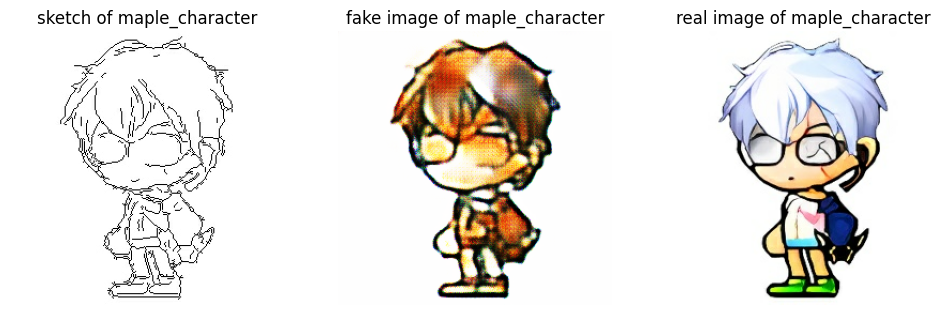

mean_discriminator_loss : 0.26362916827201843
mean_generator_loss : 2.4021718502044678
mean_generator_L1_loss : 0.20540876686573029


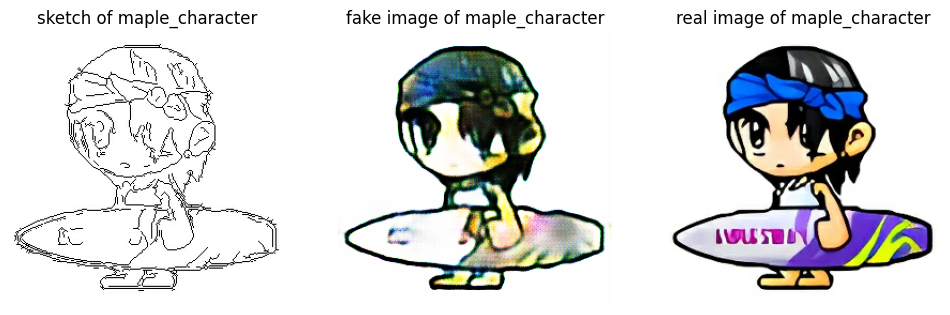

mean_discriminator_loss : 0.2623937129974365
mean_generator_loss : 2.148768424987793
mean_generator_L1_loss : 0.18148042261600494


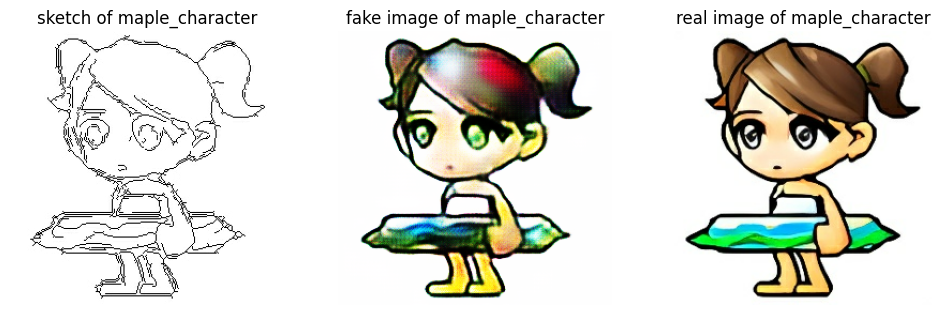

mean_discriminator_loss : 0.2624601423740387
mean_generator_loss : 1.9686341285705566
mean_generator_L1_loss : 0.16410565376281738


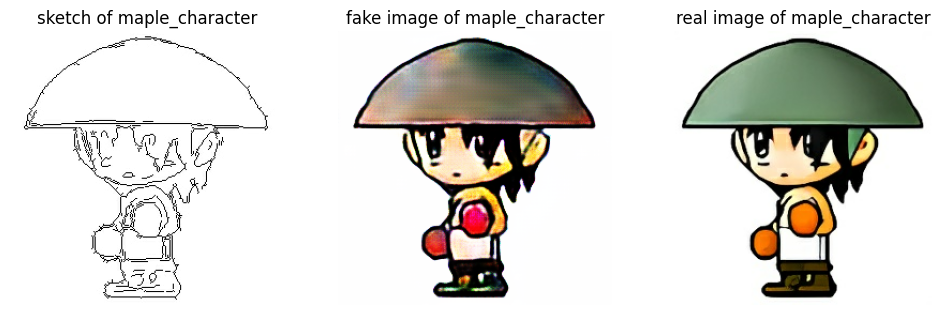

mean_discriminator_loss : 0.263814240694046
mean_generator_loss : 1.8853650093078613
mean_generator_L1_loss : 0.15573759377002716


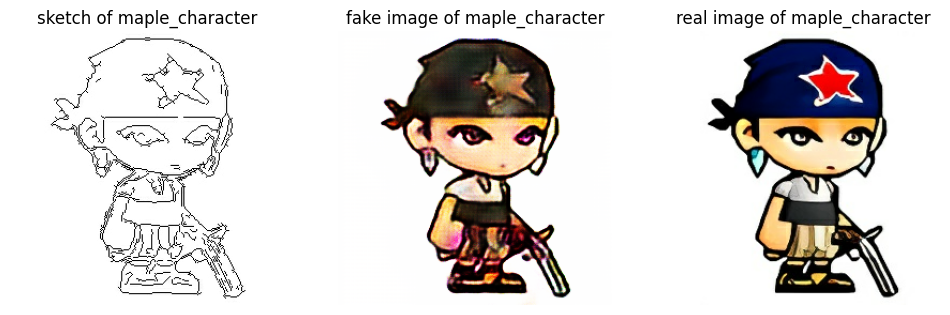

mean_discriminator_loss : 0.26009103655815125
mean_generator_loss : 1.8072909116744995
mean_generator_L1_loss : 0.1479908972978592


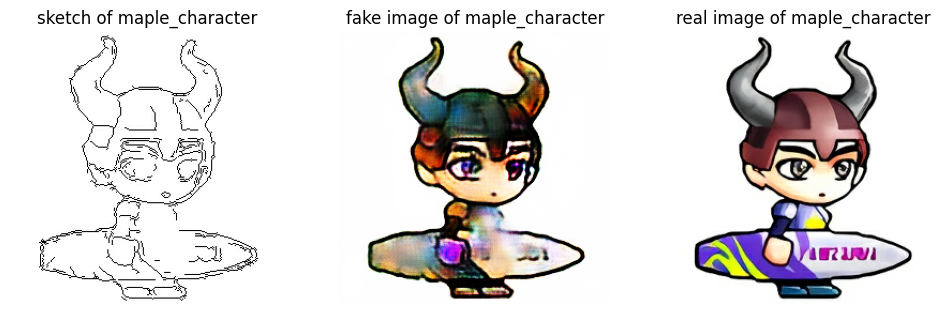

mean_discriminator_loss : 0.2592223286628723
mean_generator_loss : 1.7169400453567505
mean_generator_L1_loss : 0.13893701136112213


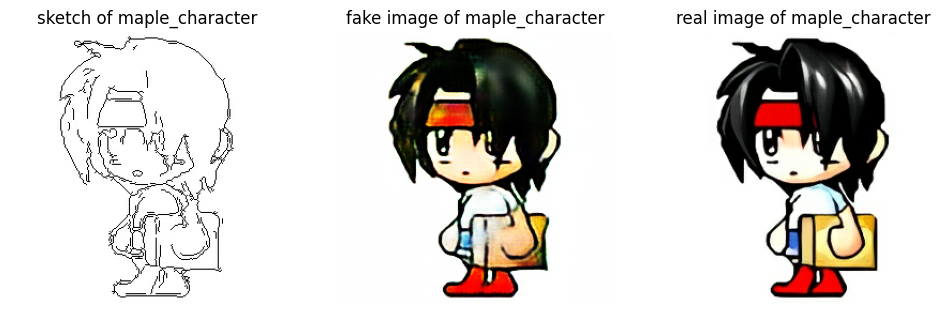

mean_discriminator_loss : 0.25924721360206604
mean_generator_loss : 1.7007585763931274
mean_generator_L1_loss : 0.13725337386131287


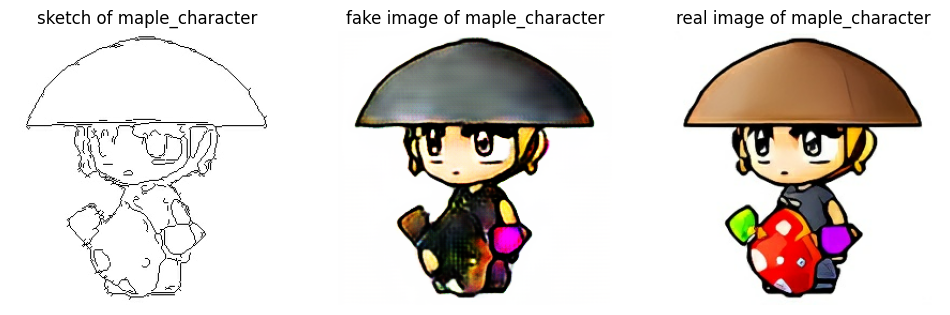

mean_discriminator_loss : 0.25994497537612915
mean_generator_loss : 1.6382255554199219
mean_generator_L1_loss : 0.1313714236021042


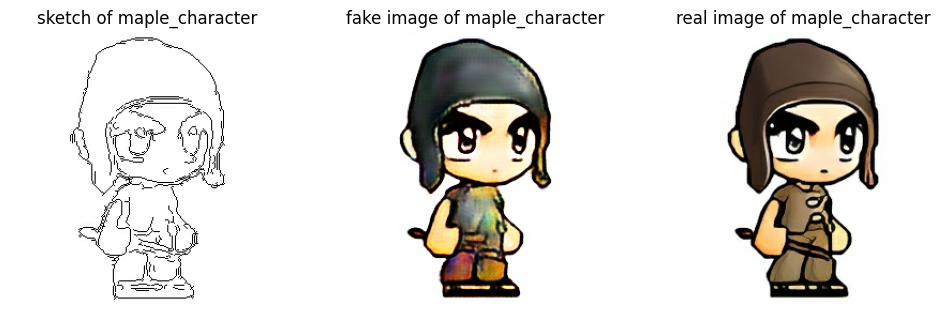

mean_discriminator_loss : 0.25839632749557495
mean_generator_loss : 1.5986570119857788
mean_generator_L1_loss : 0.12768074870109558


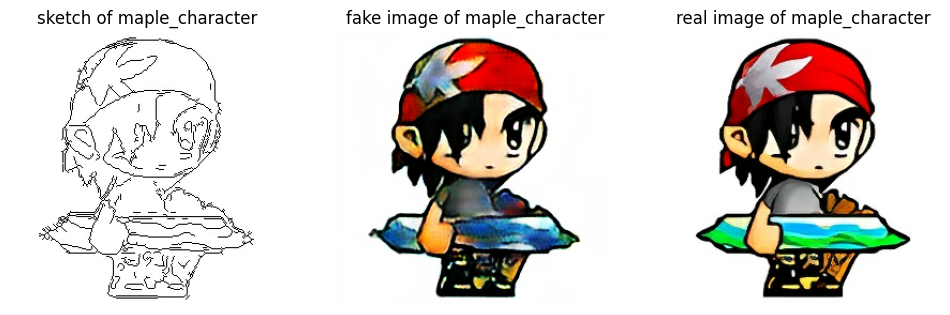

mean_discriminator_loss : 0.25626352429389954
mean_generator_loss : 1.5428639650344849
mean_generator_L1_loss : 0.12218160927295685


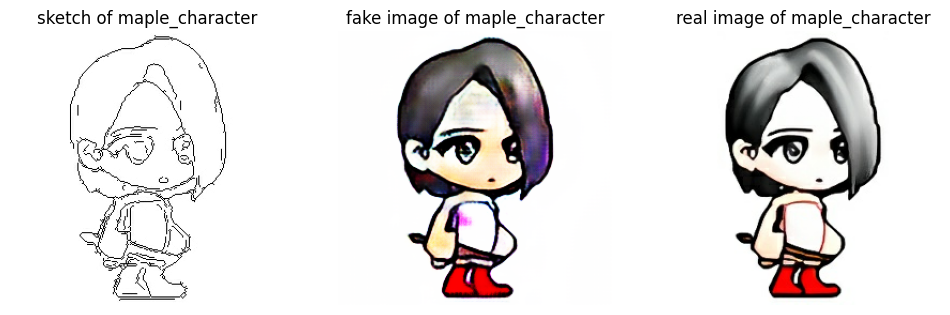

mean_discriminator_loss : 0.25692781805992126
mean_generator_loss : 1.5073429346084595
mean_generator_L1_loss : 0.11862977594137192


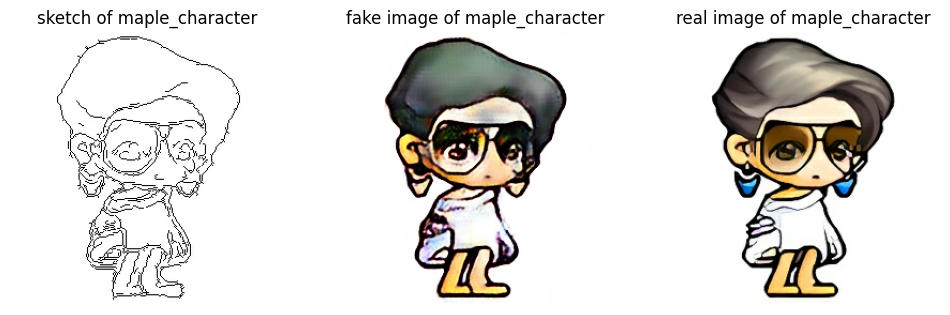

mean_discriminator_loss : 0.2561939060688019
mean_generator_loss : 1.5029089450836182
mean_generator_L1_loss : 0.11792447417974472


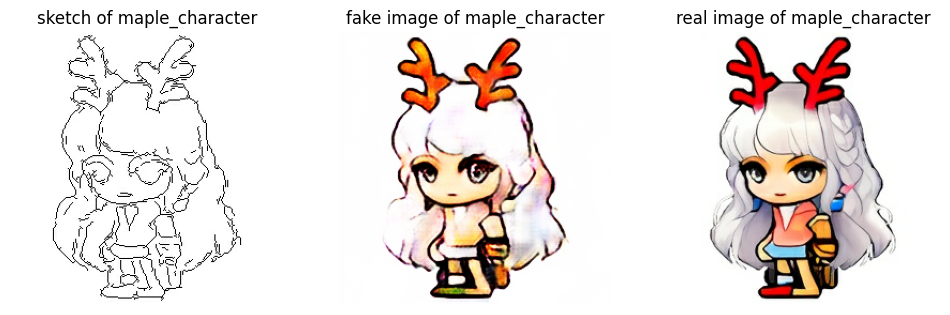

mean_discriminator_loss : 0.2566021680831909
mean_generator_loss : 1.4954626560211182
mean_generator_L1_loss : 0.11676342040300369


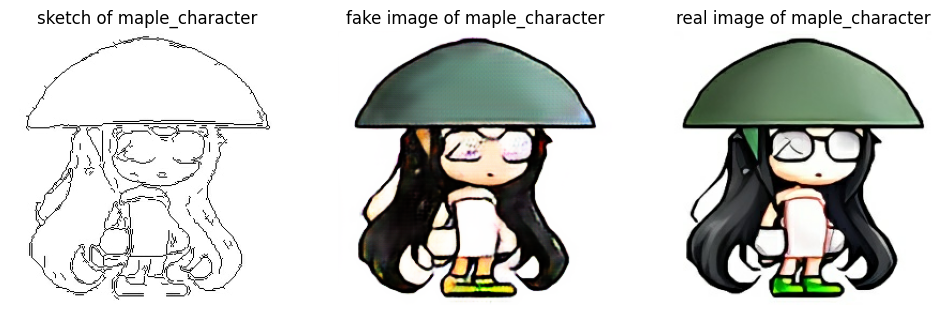

mean_discriminator_loss : 0.2549743354320526
mean_generator_loss : 1.4664416313171387
mean_generator_L1_loss : 0.11402972042560577


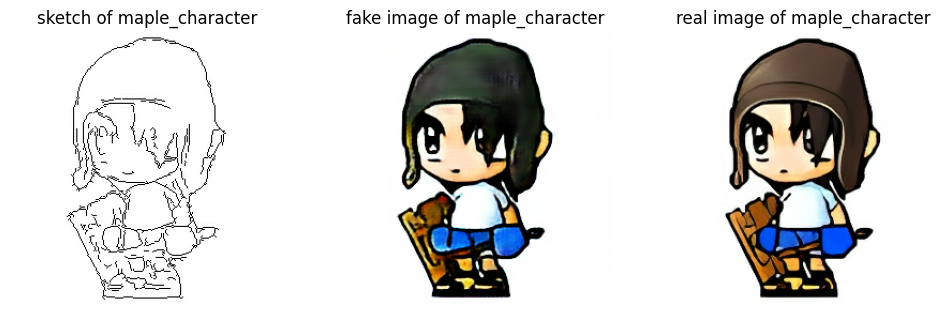

mean_discriminator_loss : 0.2514823377132416
mean_generator_loss : 1.410355806350708
mean_generator_L1_loss : 0.10904298722743988


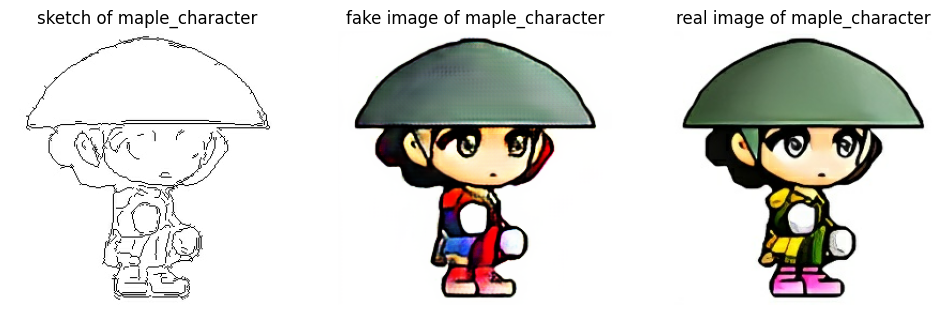

mean_discriminator_loss : 0.25318780541419983
mean_generator_loss : 1.4036269187927246
mean_generator_L1_loss : 0.10819904506206512


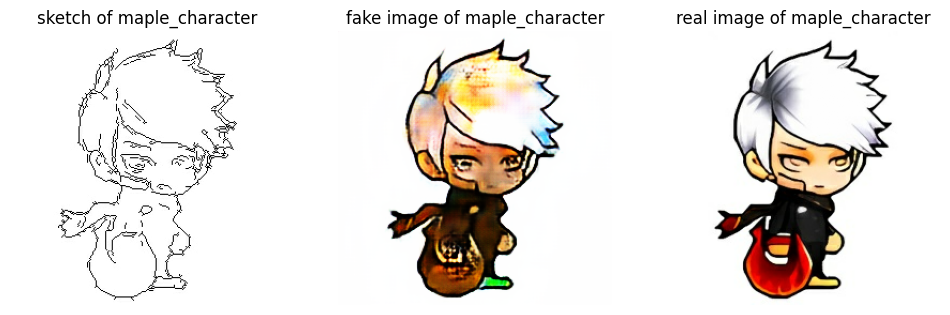

mean_discriminator_loss : 0.251645028591156
mean_generator_loss : 1.3950557708740234
mean_generator_L1_loss : 0.10705363750457764


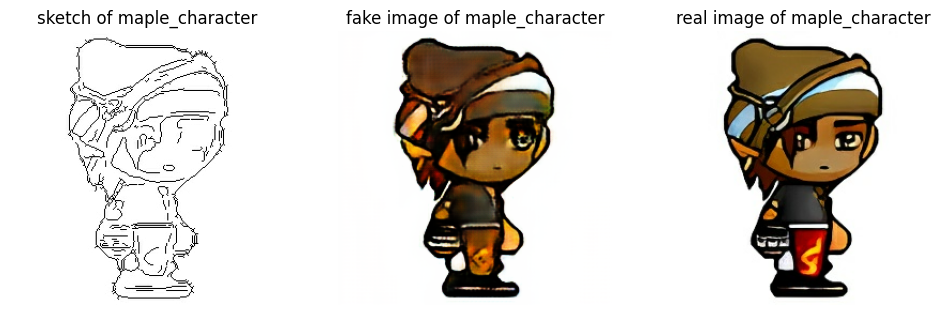

mean_discriminator_loss : 0.2490549236536026
mean_generator_loss : 1.3928253650665283
mean_generator_L1_loss : 0.10658648610115051


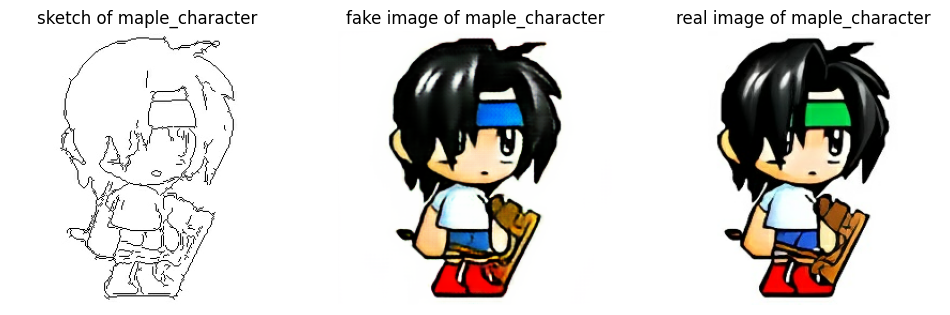

mean_discriminator_loss : 0.2503950893878937
mean_generator_loss : 1.3823635578155518
mean_generator_L1_loss : 0.10562688112258911


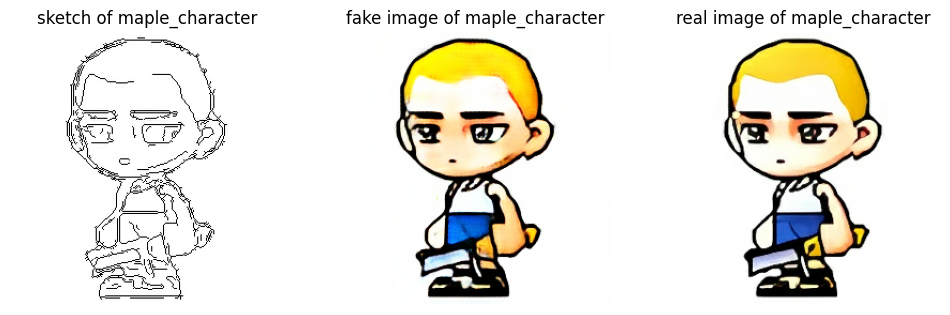

mean_discriminator_loss : 0.24986475706100464
mean_generator_loss : 1.3566545248031616
mean_generator_L1_loss : 0.10282566398382187


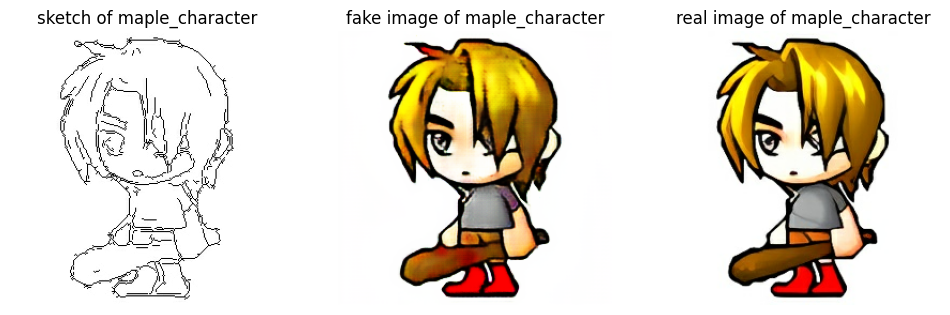

mean_discriminator_loss : 0.24999867379665375
mean_generator_loss : 1.3338608741760254
mean_generator_L1_loss : 0.10133310407400131


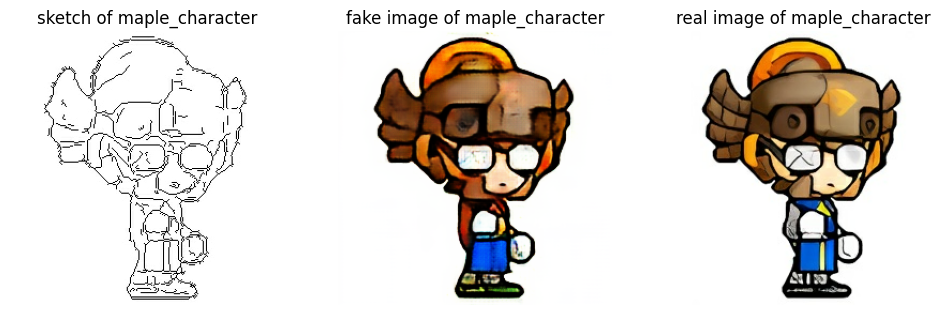

mean_discriminator_loss : 0.2479778677225113
mean_generator_loss : 1.3305139541625977
mean_generator_L1_loss : 0.1003384217619896


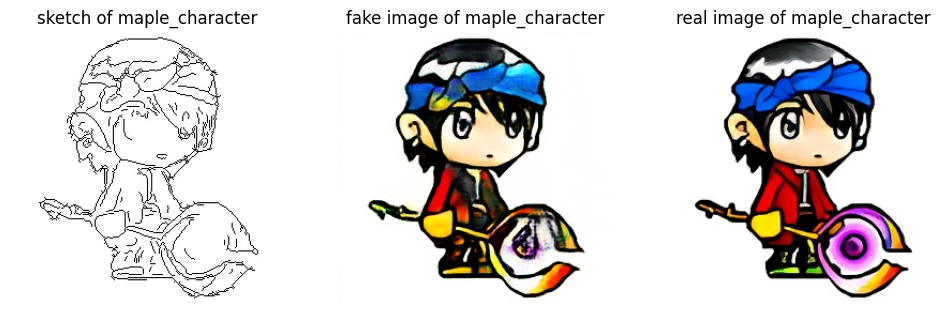

mean_discriminator_loss : 0.24816513061523438
mean_generator_loss : 1.3327245712280273
mean_generator_L1_loss : 0.10080591589212418


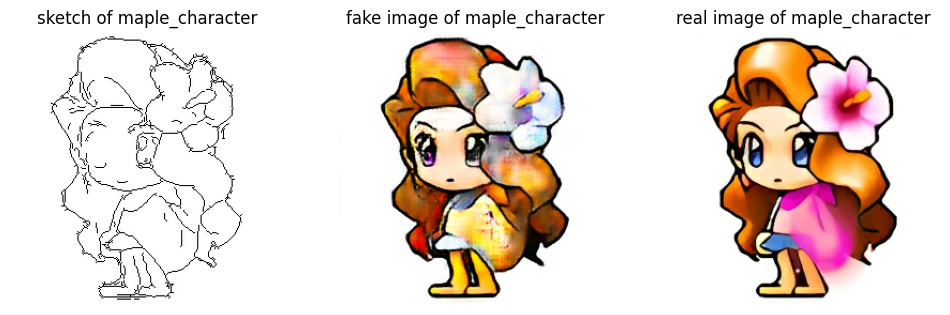

mean_discriminator_loss : 0.24660049378871918
mean_generator_loss : 1.3144279718399048
mean_generator_L1_loss : 0.09842424094676971


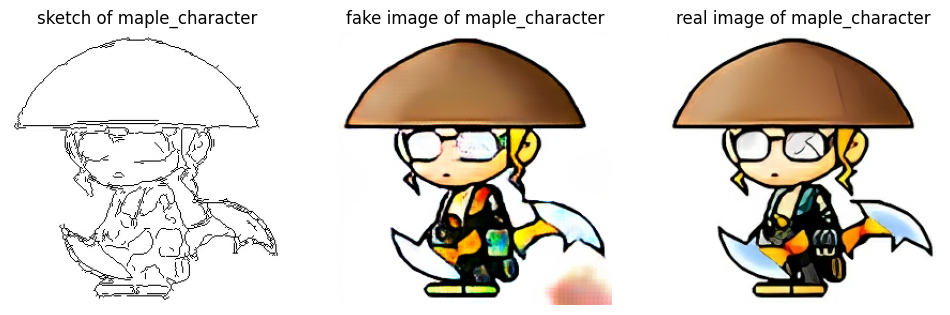

mean_discriminator_loss : 0.2462935596704483
mean_generator_loss : 1.3165628910064697
mean_generator_L1_loss : 0.09889008849859238


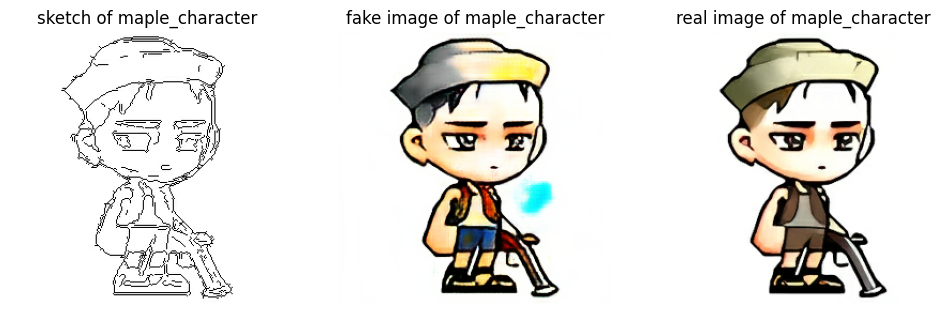

mean_discriminator_loss : 0.24650710821151733
mean_generator_loss : 1.313633918762207
mean_generator_L1_loss : 0.09883935004472733


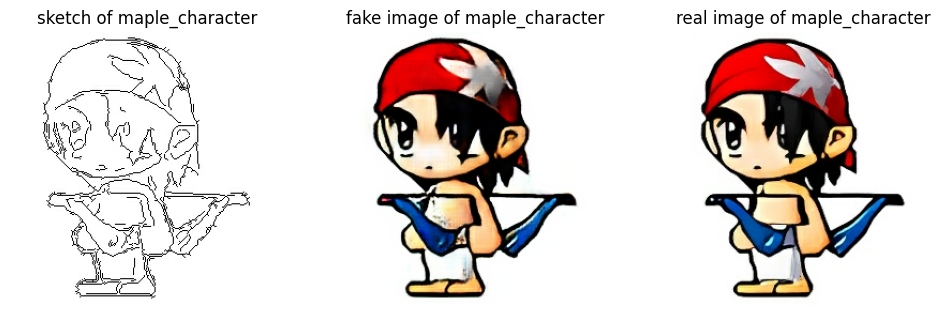

mean_discriminator_loss : 0.2481287568807602
mean_generator_loss : 1.2571805715560913
mean_generator_L1_loss : 0.09347479045391083


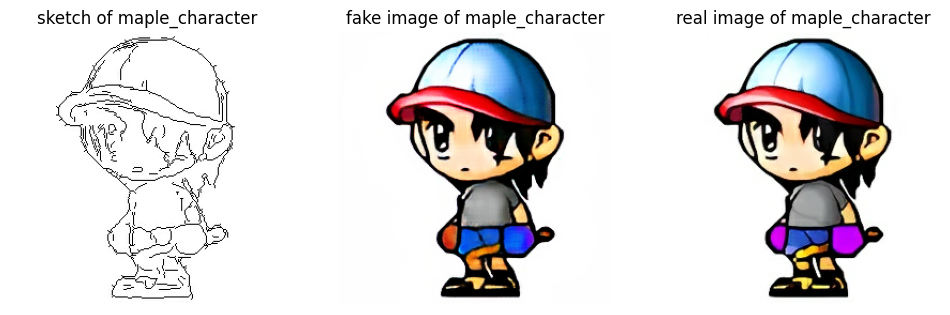

mean_discriminator_loss : 0.24775390326976776
mean_generator_loss : 1.2875938415527344
mean_generator_L1_loss : 0.09669128060340881


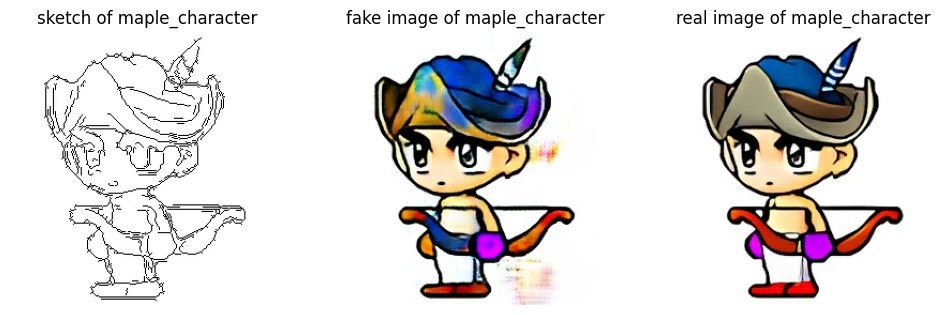

mean_discriminator_loss : 0.24690082669258118
mean_generator_loss : 1.2594431638717651
mean_generator_L1_loss : 0.0933336690068245


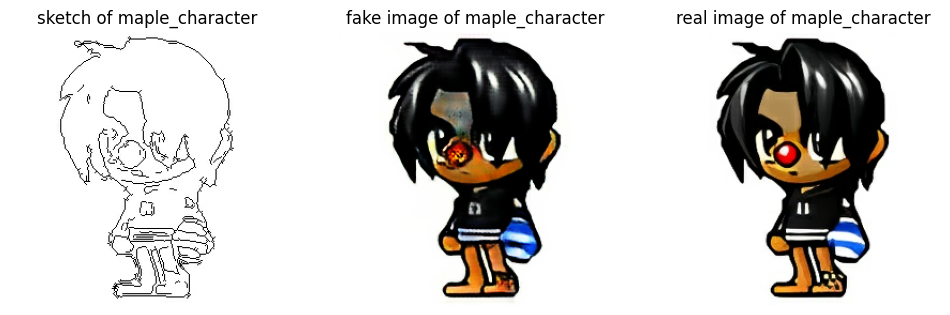

mean_discriminator_loss : 0.2456021010875702
mean_generator_loss : 1.2545106410980225
mean_generator_L1_loss : 0.09315253794193268


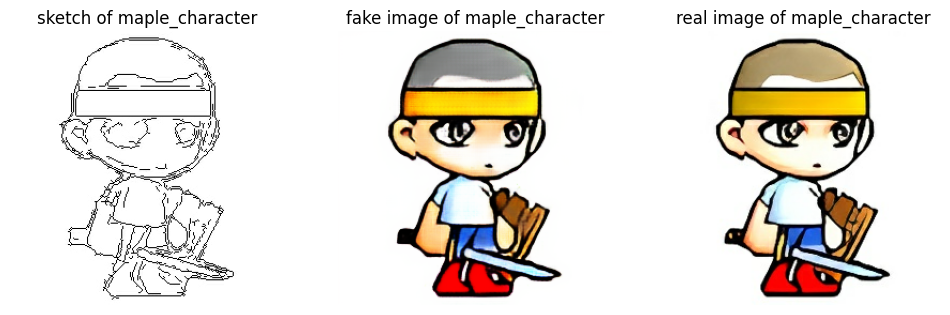

mean_discriminator_loss : 0.24514266848564148
mean_generator_loss : 1.2700423002243042
mean_generator_L1_loss : 0.09403044730424881


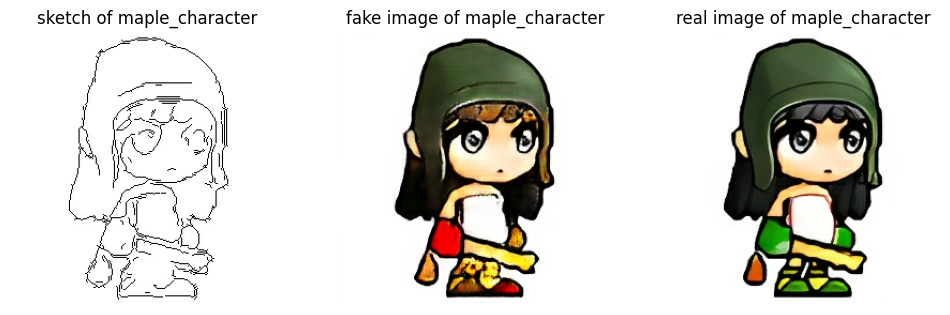

mean_discriminator_loss : 0.24562285840511322
mean_generator_loss : 1.2486313581466675
mean_generator_L1_loss : 0.09216485917568207


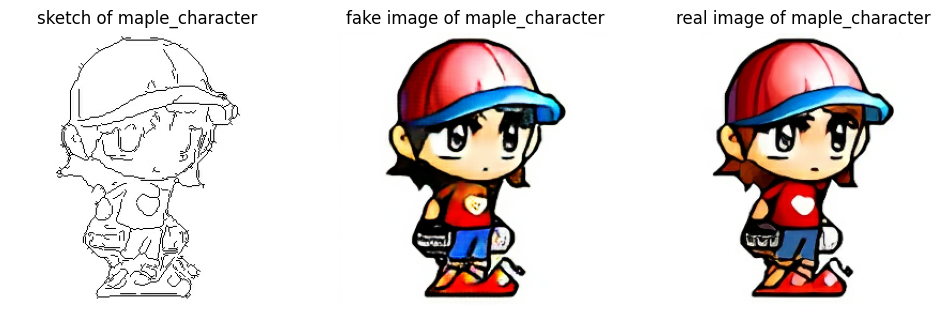

mean_discriminator_loss : 0.24220886826515198
mean_generator_loss : 1.2708728313446045
mean_generator_L1_loss : 0.09342730045318604


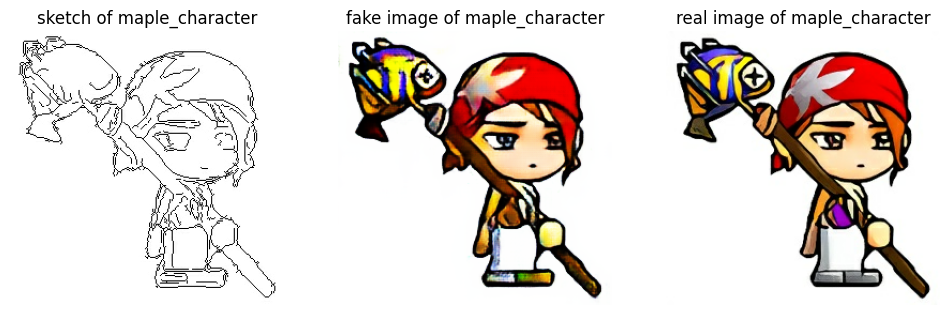

Saving checkpoint for epoch 1 at ./model_checkpoints/maple_character/ckpt-1

================= Epoch 1 ends ===================
================= Epoch 2 begins =================



  0%|          | 0/17343 [00:00<?, ?it/s]

mean_discriminator_loss : 0.24267973005771637
mean_generator_loss : 1.2445271015167236
mean_generator_L1_loss : 0.09108240157365799


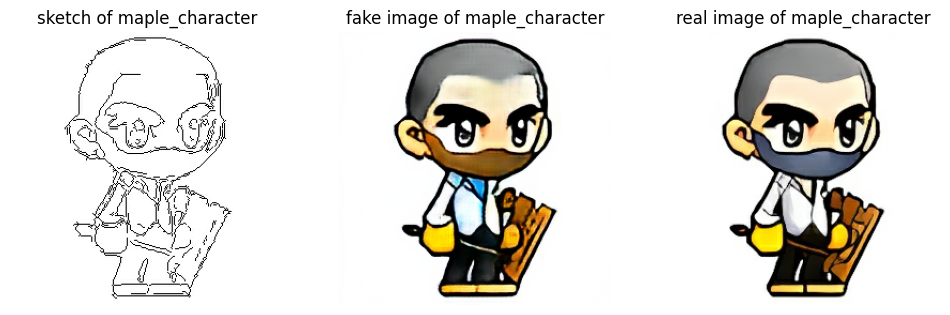

mean_discriminator_loss : 0.24044109880924225
mean_generator_loss : 1.2650045156478882
mean_generator_L1_loss : 0.0926600769162178


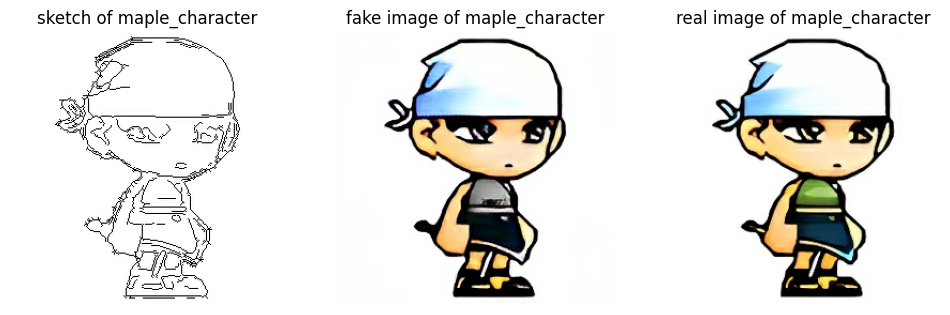

mean_discriminator_loss : 0.24132102727890015
mean_generator_loss : 1.2222553491592407
mean_generator_L1_loss : 0.08883307874202728


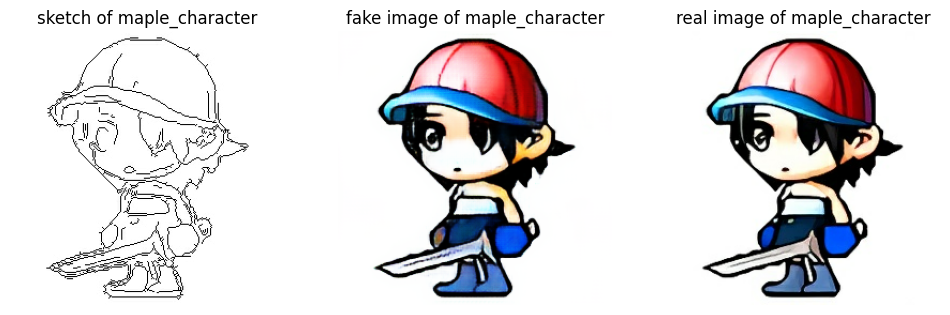

mean_discriminator_loss : 0.24039223790168762
mean_generator_loss : 1.238660454750061
mean_generator_L1_loss : 0.08959231525659561


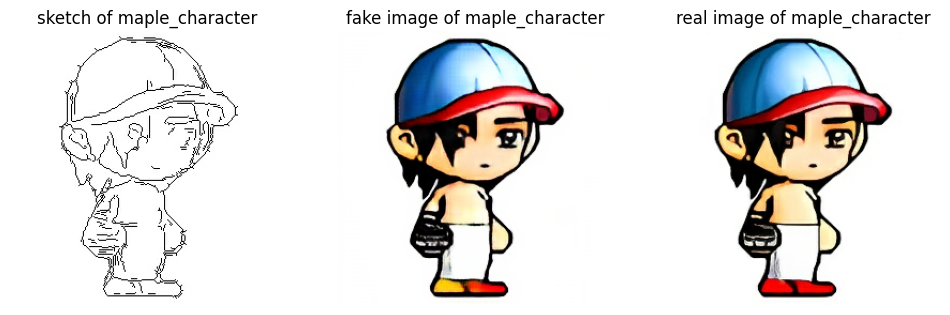

mean_discriminator_loss : 0.240665465593338
mean_generator_loss : 1.229604721069336
mean_generator_L1_loss : 0.08886633813381195


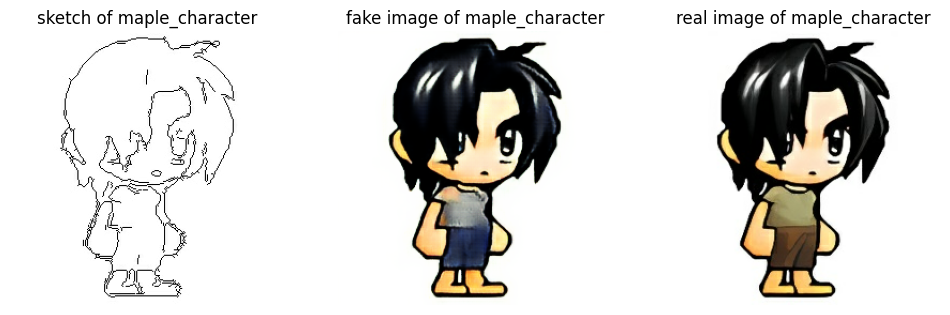

mean_discriminator_loss : 0.2380208522081375
mean_generator_loss : 1.2402487993240356
mean_generator_L1_loss : 0.08917731046676636


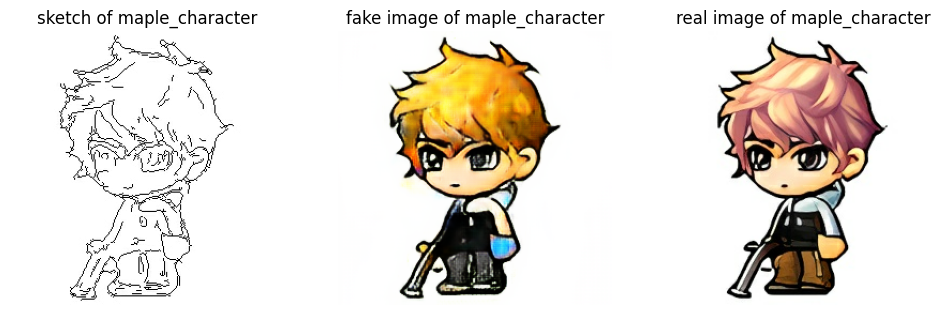

mean_discriminator_loss : 0.23616237938404083
mean_generator_loss : 1.2426990270614624
mean_generator_L1_loss : 0.08894941955804825


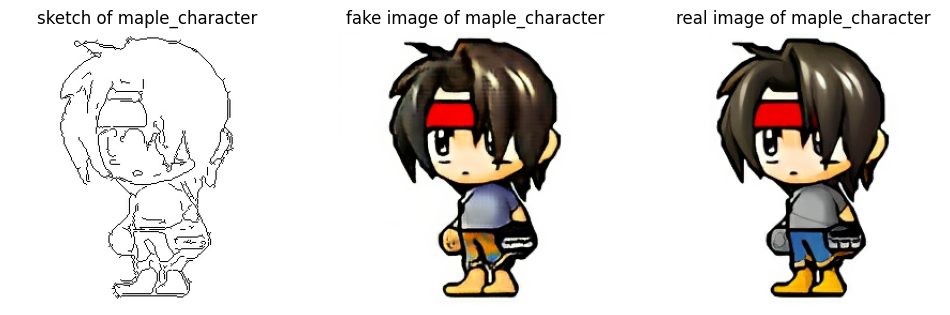

mean_discriminator_loss : 0.23486410081386566
mean_generator_loss : 1.2343190908432007
mean_generator_L1_loss : 0.08791501075029373


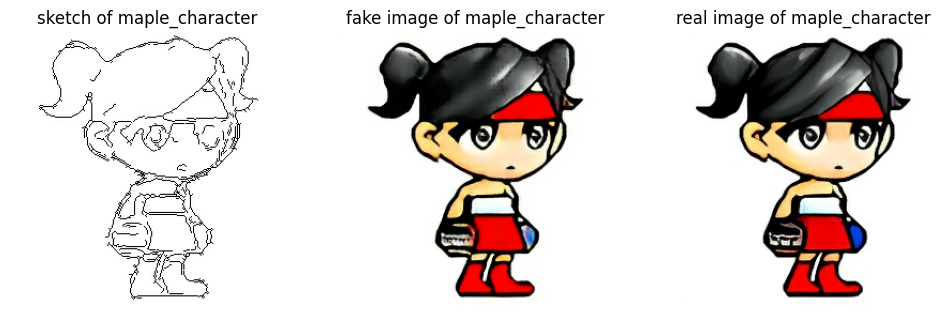

mean_discriminator_loss : 0.23607167601585388
mean_generator_loss : 1.2460126876831055
mean_generator_L1_loss : 0.0893058106303215


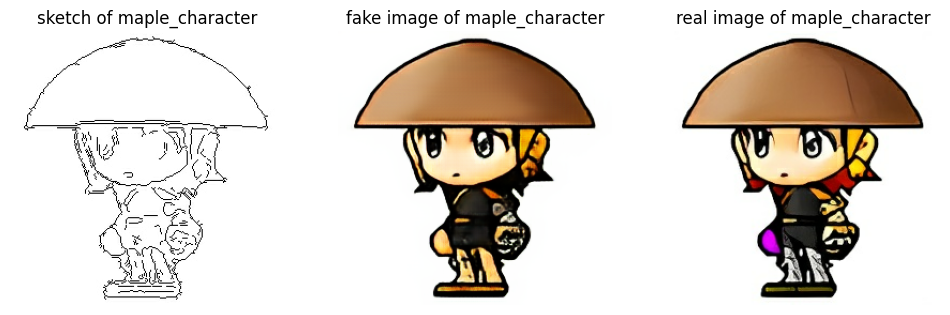

mean_discriminator_loss : 0.2353261113166809
mean_generator_loss : 1.2310073375701904
mean_generator_L1_loss : 0.08776168525218964


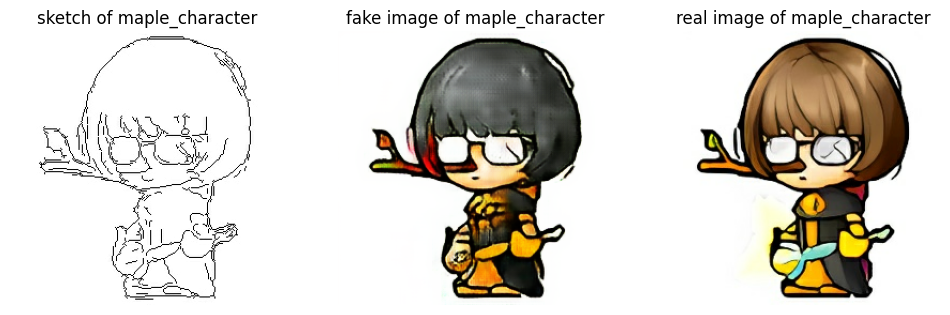

mean_discriminator_loss : 0.23522254824638367
mean_generator_loss : 1.2397032976150513
mean_generator_L1_loss : 0.08831814676523209


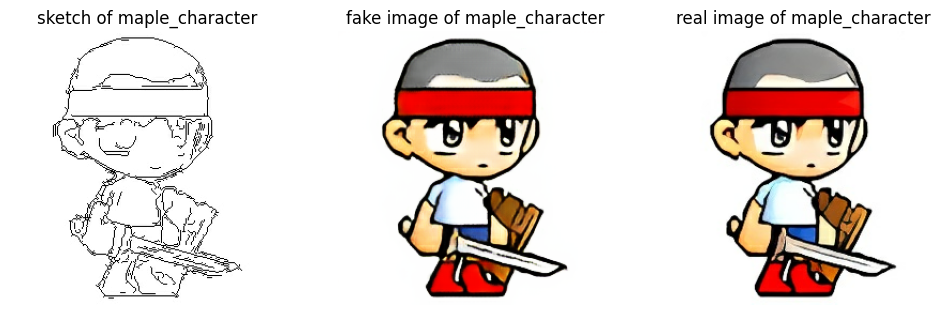

mean_discriminator_loss : 0.2313881814479828
mean_generator_loss : 1.2430211305618286
mean_generator_L1_loss : 0.08814997971057892


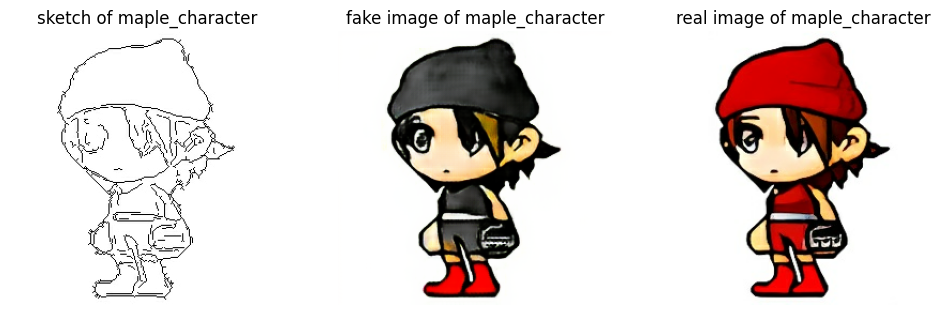

mean_discriminator_loss : 0.23364843428134918
mean_generator_loss : 1.2394933700561523
mean_generator_L1_loss : 0.08778148144483566


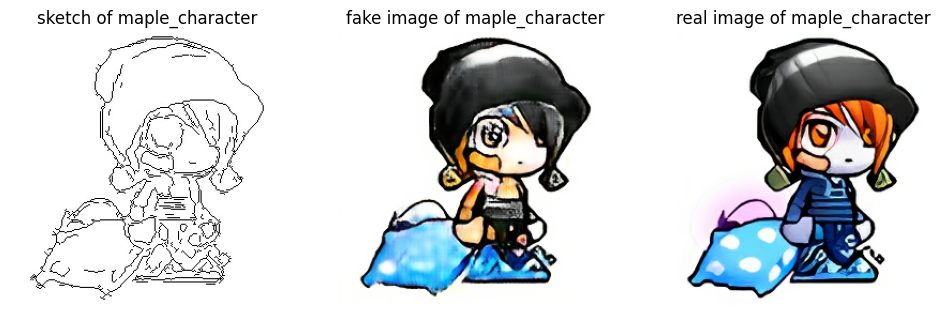

mean_discriminator_loss : 0.23514887690544128
mean_generator_loss : 1.2255964279174805
mean_generator_L1_loss : 0.08707916736602783


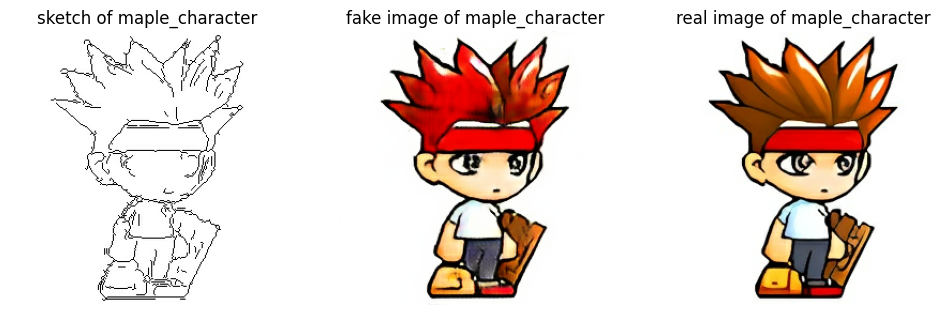

mean_discriminator_loss : 0.23372027277946472
mean_generator_loss : 1.2625560760498047
mean_generator_L1_loss : 0.08966926485300064


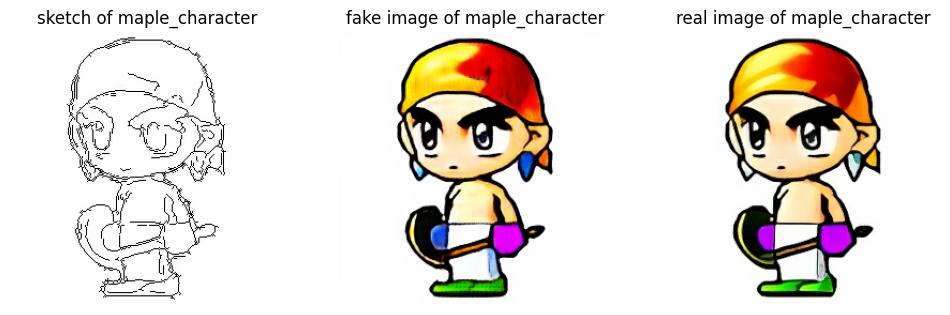

mean_discriminator_loss : 0.2317160964012146
mean_generator_loss : 1.238335371017456
mean_generator_L1_loss : 0.08752129971981049


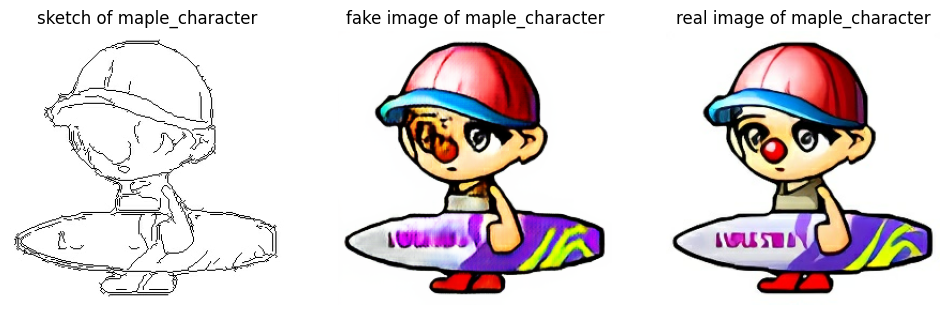

mean_discriminator_loss : 0.23176883161067963
mean_generator_loss : 1.240668773651123
mean_generator_L1_loss : 0.08764322847127914


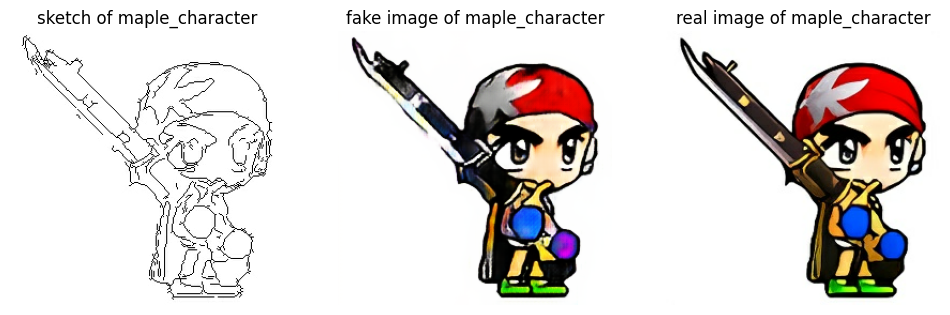

mean_discriminator_loss : 0.23438884317874908
mean_generator_loss : 1.2308660745620728
mean_generator_L1_loss : 0.08697856962680817


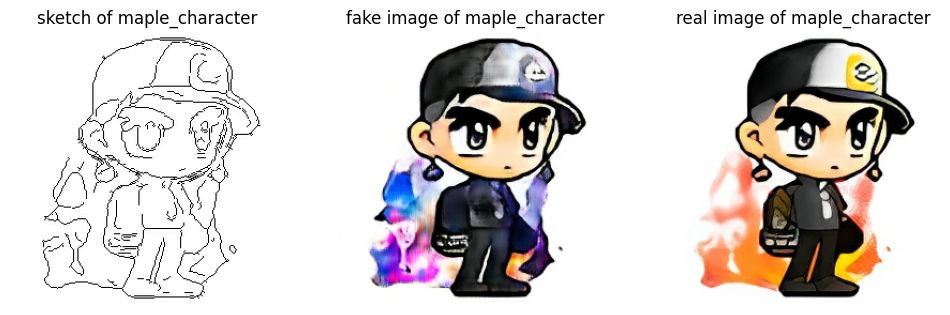

mean_discriminator_loss : 0.23142312467098236
mean_generator_loss : 1.219578504562378
mean_generator_L1_loss : 0.08571035414934158


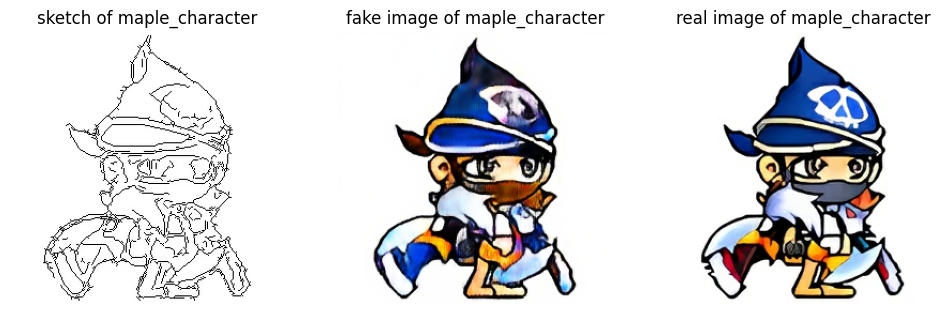

mean_discriminator_loss : 0.2336364984512329
mean_generator_loss : 1.230170488357544
mean_generator_L1_loss : 0.08689459413290024


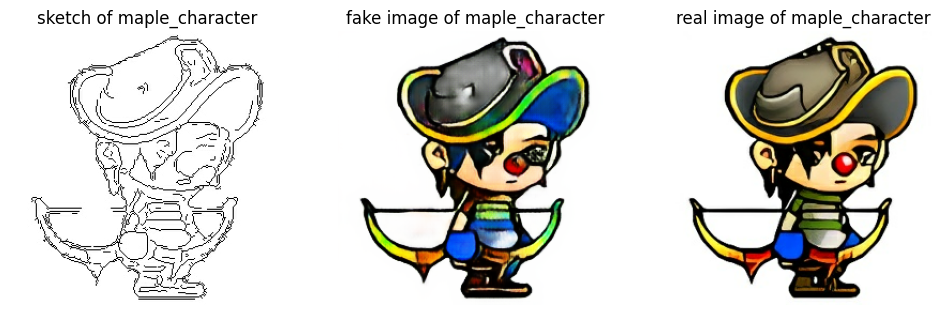

mean_discriminator_loss : 0.23134450614452362
mean_generator_loss : 1.2266790866851807
mean_generator_L1_loss : 0.08575813472270966


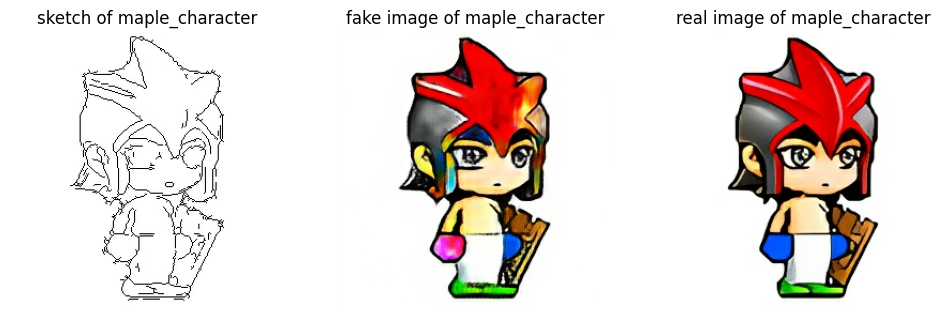

mean_discriminator_loss : 0.22999241948127747
mean_generator_loss : 1.2207103967666626
mean_generator_L1_loss : 0.08491428196430206


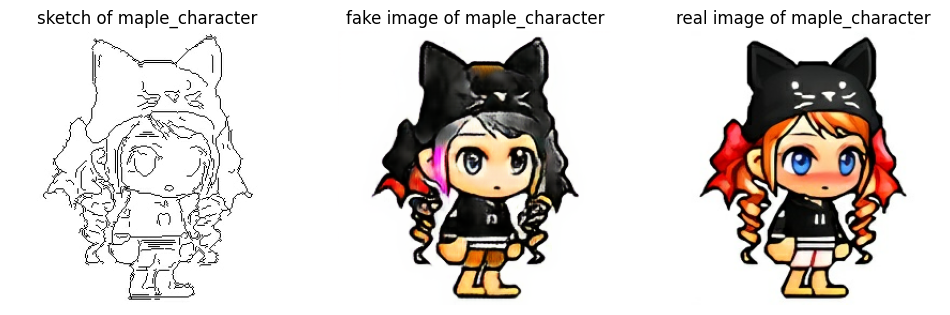

mean_discriminator_loss : 0.22839558124542236
mean_generator_loss : 1.2364397048950195
mean_generator_L1_loss : 0.08580458164215088


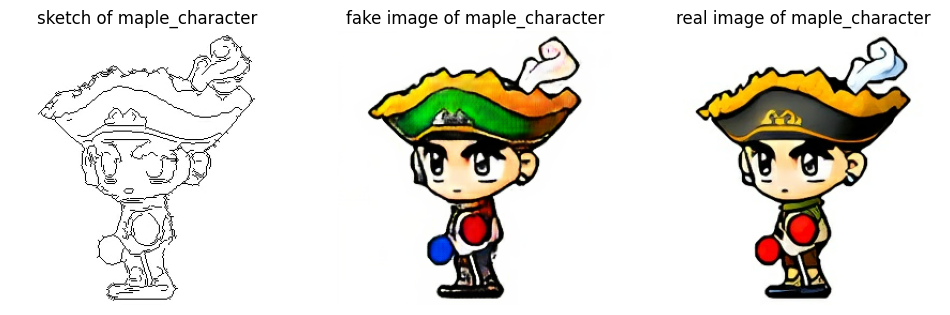

mean_discriminator_loss : 0.22873541712760925
mean_generator_loss : 1.212517499923706
mean_generator_L1_loss : 0.08385786414146423


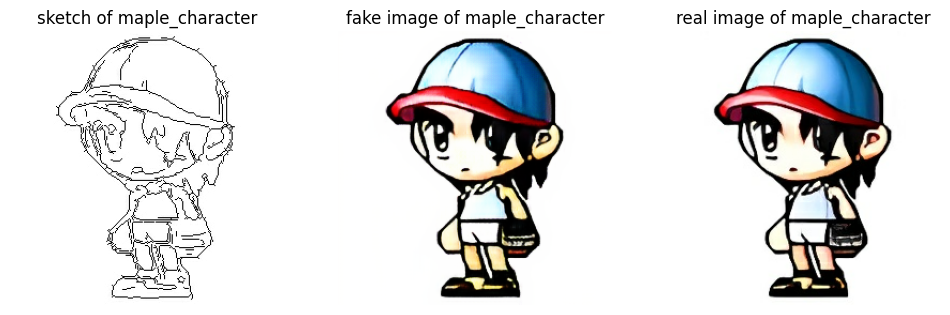

mean_discriminator_loss : 0.23186160624027252
mean_generator_loss : 1.2113035917282104
mean_generator_L1_loss : 0.08417382091283798


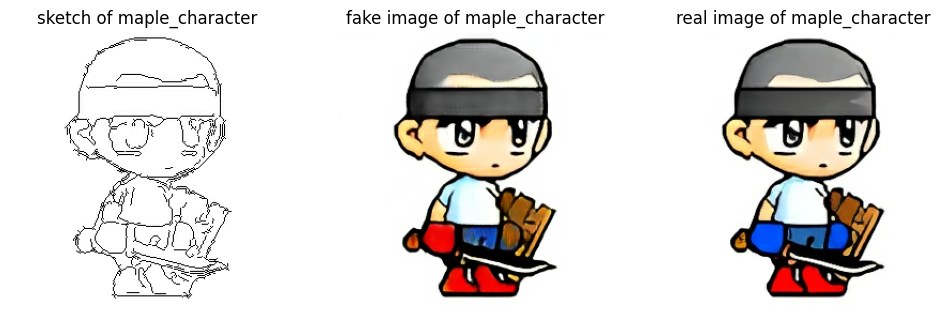

mean_discriminator_loss : 0.2296677678823471
mean_generator_loss : 1.2382501363754272
mean_generator_L1_loss : 0.0857953205704689


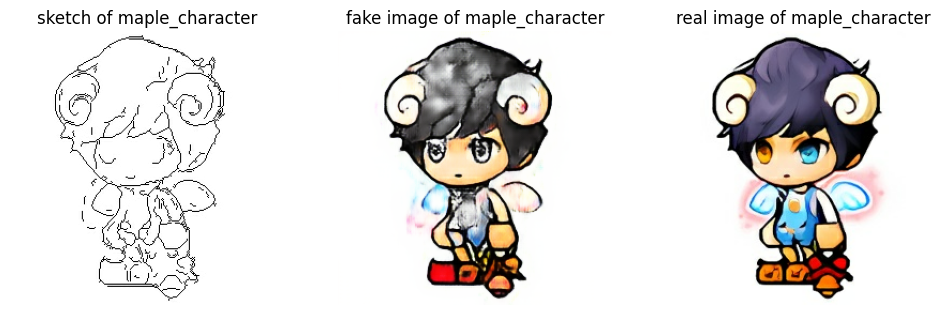

mean_discriminator_loss : 0.22662268579006195
mean_generator_loss : 1.2445104122161865
mean_generator_L1_loss : 0.08624458312988281


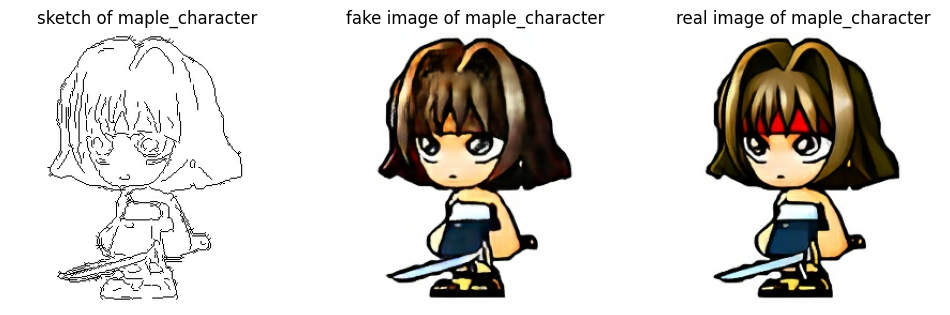

mean_discriminator_loss : 0.2284460812807083
mean_generator_loss : 1.2343043088912964
mean_generator_L1_loss : 0.08575878292322159


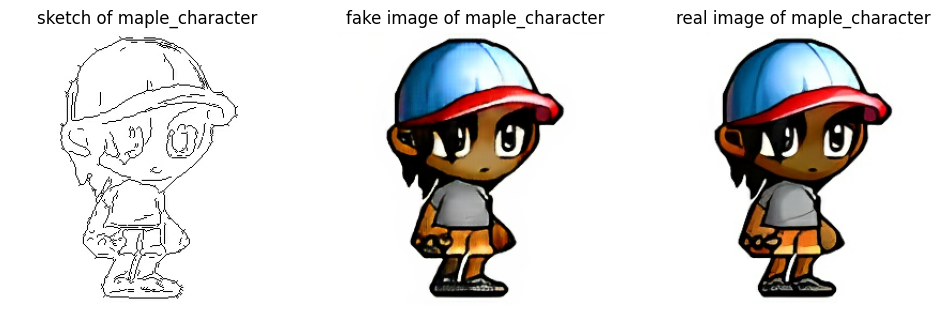

mean_discriminator_loss : 0.23050297796726227
mean_generator_loss : 1.2103679180145264
mean_generator_L1_loss : 0.08351308852434158


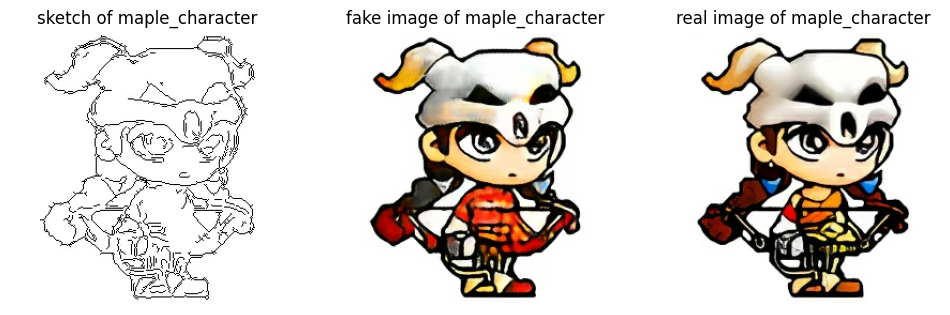

mean_discriminator_loss : 0.22767706215381622
mean_generator_loss : 1.198168158531189
mean_generator_L1_loss : 0.08238988369703293


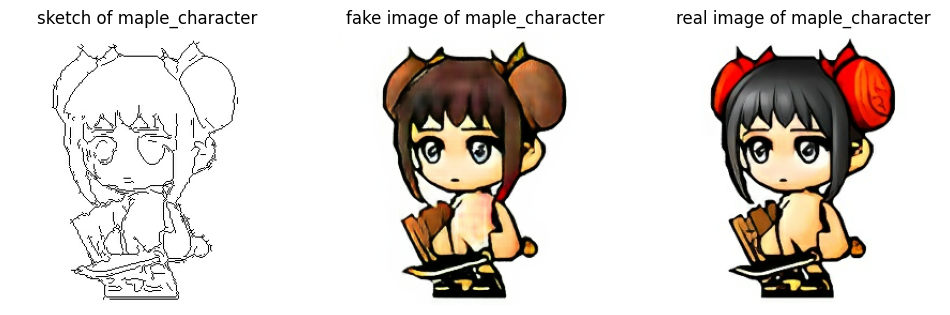

In [ ]:
epoch_offset = 0           # 이전까지 학습시킨 epoch 수
num_of_epochs = 30         # 이번에 학습시킬 epoch 수

# 몇 step마다 중간 경과를 출력하고, 몇 epoch마다 저장할지
display_frequency = 500  # 단위 : steps
save_frequency = 1        # 단위 : epochs

# 계속 더하다가 display_frequency 마다 중간 경과를 보여줄거
sum_of_discriminator_loss = 0
sum_of_generator_loss = 0
sum_of_generator_L1_loss = 0

# 이번 학습에서의 step 수 => display_frequency 마다 중간 경과를 출력할 거
step = 0

# training
for epoch in range(epoch_offset, epoch_offset + num_of_epochs):

    print(f'================= Epoch {epoch + 1} begins =================')
    print()

    # # 100 ~ 200 epoch 동안, learning rate에 linear decay를 적용해서 0으로 만들자
    # if epoch >= 100:
    #     # 이번 epoch에서 사용할 learning rate
    #     cur_learning_rate = learning_rate - (learning_rate/100)*(epoch - 100)

    #     # 두 optimizer의 learning rate update
    #     tf.keras.backend.set_value(generator_optimizer.learning_rate, cur_learning_rate)
    #     tf.keras.backend.set_value(discriminator_optimizer.learning_rate, cur_learning_rate)

    #     print(f'Linearly decay the learning rate => current learning rate : {cur_learning_rate}')

    # 1 epoch
    for sketch_image, real_image in tqdm(training_dataset):

        # step을 1 증가시키자
        step += 1

        # 1 step
        discriminator_loss, generator_loss, generator_L1_loss = train_step(sketch_image, real_image, LAMBDA)

        # 누적값 계산
        sum_of_discriminator_loss += discriminator_loss
        sum_of_generator_loss += generator_loss
        sum_of_generator_L1_loss += generator_L1_loss

        # display_frequency 마다
        if step % display_frequency == 0:
            # loss 출력
            print(f'mean_discriminator_loss : {sum_of_discriminator_loss / display_frequency}')
            print(f'mean_generator_loss : {sum_of_generator_loss / display_frequency}')
            print(f'mean_generator_L1_loss : {sum_of_generator_L1_loss / display_frequency}')

            # 초기화
            sum_of_discriminator_loss = 0
            sum_of_generator_loss = 0
            sum_of_generator_L1_loss = 0

            # 사진 출력
            plot_images_during_training(sketch_image, real_image, target_name)

    # save_frequency마다 model weight 저장
    if (epoch + 1) % save_frequency == 0:
        ckpt_save_path = ckpt_manager.save()
        print('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))

    print()
    print(f'================= Epoch {epoch + 1} ends ===================')

